In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, confusion_matrix
from scikitplot.metrics import roc_curve, auc
from yellowbrick.classifier import class_prediction_error, ConfusionMatrix, precision_recall_curve

In [2]:
plt.rcParams['figure.dpi']=500
plt.rcParams['figure.figsize']=[15,6]

Load Data

In [3]:
df = pd.read_csv("waterQuality1.csv")
df.head().style.background_gradient(cmap = 'Blues', axis = 0)

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.650000,9.08,0.040000,2.850000,0.007000,0.350000,0.830000,0.170000,0.050000,0.200000,0.000000,0.054000,16.080000,1.130000,0.007000,37.750000,6.780000,0.080000,0.340000,0.020000,1
1,2.320000,21.16,0.010000,3.310000,0.002000,5.280000,0.680000,0.660000,0.900000,0.650000,0.650000,0.100000,2.010000,1.930000,0.003000,32.260000,3.210000,0.080000,0.270000,0.050000,1
2,1.010000,14.02,0.040000,0.580000,0.008000,4.240000,0.530000,0.020000,0.990000,0.050000,0.003000,0.078000,14.160000,1.110000,0.006000,50.280000,7.070000,0.070000,0.440000,0.010000,0
3,1.360000,11.33,0.040000,2.960000,0.001000,7.230000,0.030000,1.660000,1.080000,0.710000,0.710000,0.016000,1.410000,1.290000,0.004000,9.120000,1.720000,0.020000,0.450000,0.050000,1
4,0.920000,24.33,0.030000,0.200000,0.006000,2.670000,0.690000,0.570000,0.610000,0.130000,0.001000,0.117000,6.740000,1.110000,0.003000,16.900000,2.410000,0.020000,0.060000,0.020000,1


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7999 non-null   float64
 1   ammonia      7999 non-null   object 
 2   arsenic      7999 non-null   float64
 3   barium       7999 non-null   float64
 4   cadmium      7999 non-null   float64
 5   chloramine   7999 non-null   float64
 6   chromium     7999 non-null   float64
 7   copper       7999 non-null   float64
 8   flouride     7999 non-null   float64
 9   bacteria     7999 non-null   float64
 10  viruses      7999 non-null   float64
 11  lead         7999 non-null   float64
 12  nitrates     7999 non-null   float64
 13  nitrites     7999 non-null   float64
 14  mercury      7999 non-null   float64
 15  perchlorate  7999 non-null   float64
 16  radium       7999 non-null   float64
 17  selenium     7999 non-null   float64
 18  silver       7999 non-null   float64
 19  uraniu

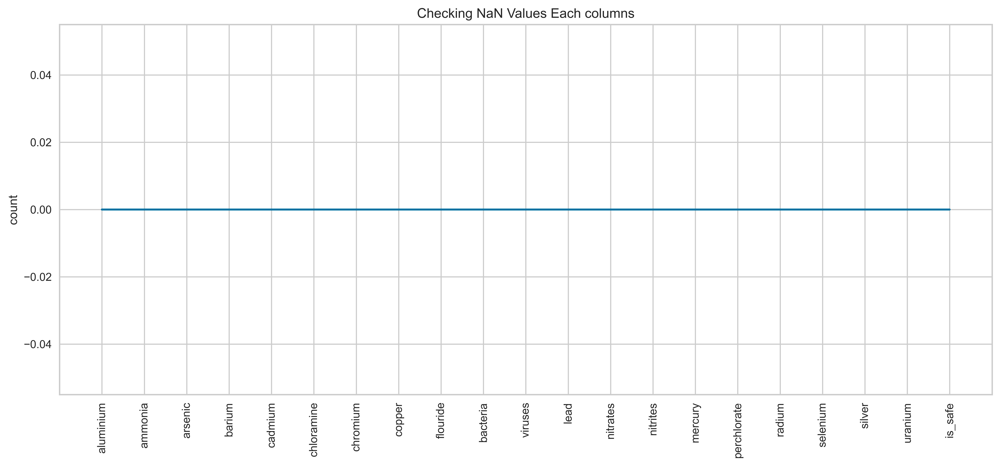

In [5]:
# Check NaN values
plt.plot(df.isnull().sum())
plt.xticks(rotation=90)
plt.title('Checking NaN Values Each columns')
plt.ylabel('count')
plt.show()

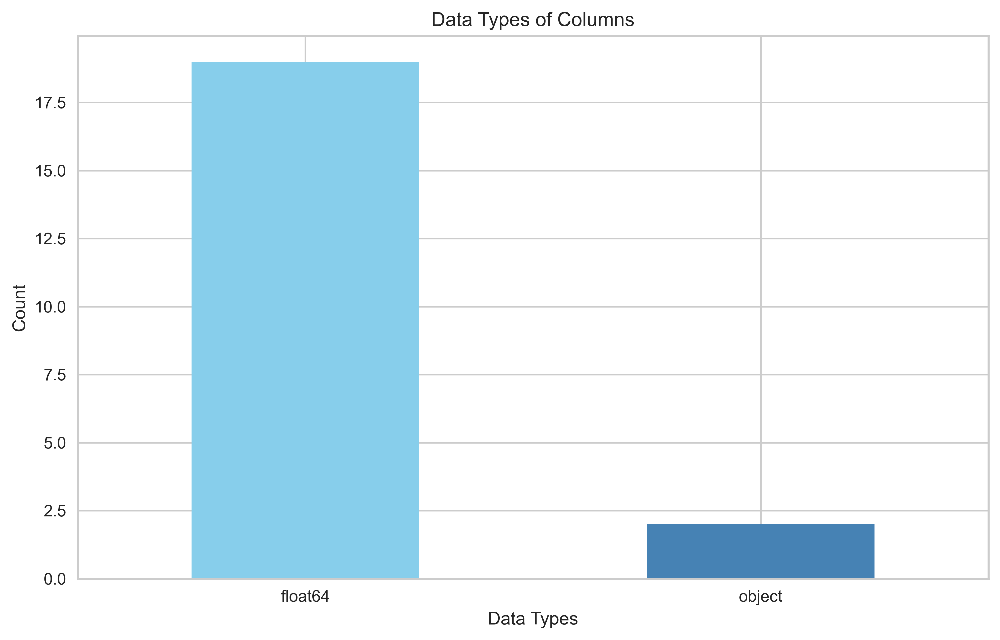

In [6]:
plt.figure(figsize=(10, 6))
df.dtypes.value_counts().plot(kind='bar', color=['skyblue','steelblue'])
plt.title('Data Types of Columns')
plt.xlabel('Data Types')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

In [7]:
num_locations = []
for index, row in df.iterrows():
    for column in df.columns:
        if row[column] == '#NUM!':
            print(f"Found '#NUM' at row {index}, column {column}")
            num_locations.append((column))

num_locations

Found '#NUM' at row 7551, column ammonia
Found '#NUM' at row 7551, column is_safe
Found '#NUM' at row 7568, column ammonia
Found '#NUM' at row 7568, column is_safe
Found '#NUM' at row 7890, column ammonia
Found '#NUM' at row 7890, column is_safe


['ammonia', 'is_safe', 'ammonia', 'is_safe', 'ammonia', 'is_safe']

In [8]:
my_set = set(num_locations)

count_ammonia = 0
count_is_safe = 0

for i in num_locations:
    if i == 'ammonia':
        count_ammonia += 1
    else:
        count_is_safe += 1
        
count_ammonia, count_is_safe

(3, 3)

In [9]:
dict_plot = {key: globals()[f'count_{key}'] for key in my_set}
dict_plot

{'is_safe': 3, 'ammonia': 3}

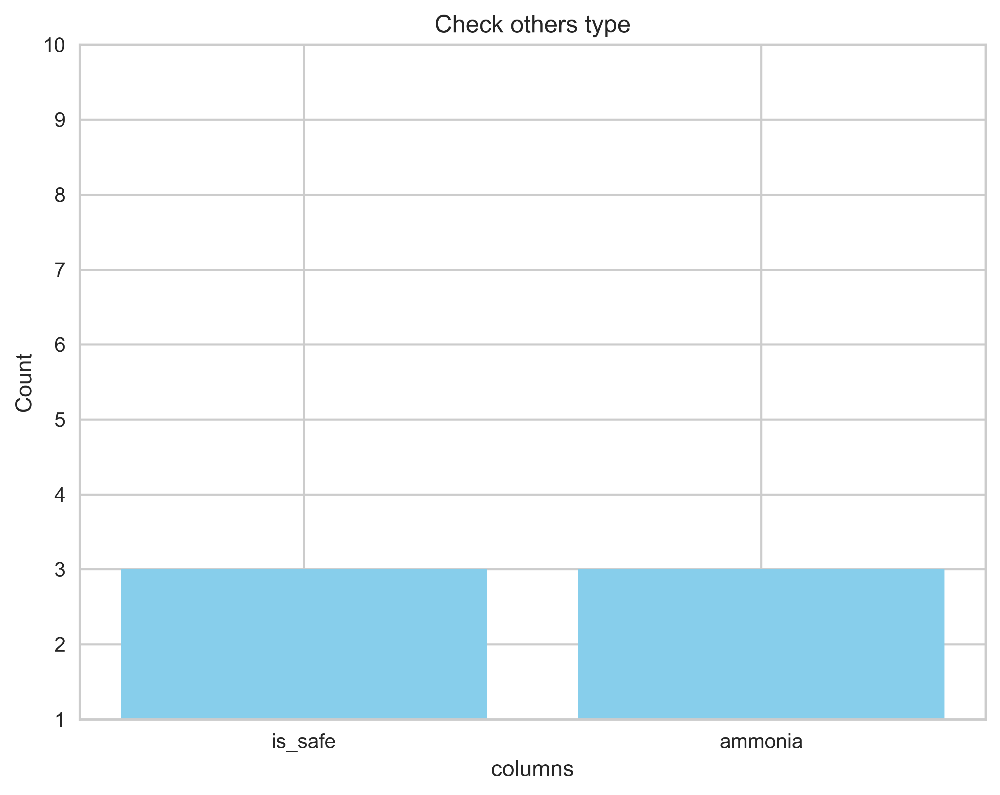

In [10]:
column_check = list(dict_plot.keys())
count_check = list(dict_plot.values())

# พล็อตกราฟ
plt.figure(figsize=(8, 6))
plt.bar(column_check, count_check, color='skyblue')
plt.title('Check others type')
plt.xlabel('columns')
plt.ylabel('Count')
plt.ylim(1, 10)
plt.show()

Change Data type

In [11]:
# fill mean in ammonia replace to #NUM!
df['ammonia'] = pd.to_numeric(df['ammonia'], errors='coerce')
mean_value = df['ammonia'].mean()
df['ammonia'].fillna(mean_value, inplace=True)

# fill 0 (not safe) in is_safe replace to #NUM!
df['is_safe'] = pd.to_numeric(df['is_safe'], errors='coerce')
min_value = df['is_safe'].min()
df['is_safe'].fillna(min_value, inplace=True)
# convert type for is_safe float to int64
df['is_safe'] = df['is_safe'].astype('Int64')

df.head().style.background_gradient(cmap = 'Blues', axis = 0)

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.650000,9.080000,0.040000,2.850000,0.007000,0.350000,0.830000,0.170000,0.050000,0.200000,0.000000,0.054000,16.080000,1.130000,0.007000,37.750000,6.780000,0.080000,0.340000,0.020000,1
1,2.320000,21.160000,0.010000,3.310000,0.002000,5.280000,0.680000,0.660000,0.900000,0.650000,0.650000,0.100000,2.010000,1.930000,0.003000,32.260000,3.210000,0.080000,0.270000,0.050000,1
2,1.010000,14.020000,0.040000,0.580000,0.008000,4.240000,0.530000,0.020000,0.990000,0.050000,0.003000,0.078000,14.160000,1.110000,0.006000,50.280000,7.070000,0.070000,0.440000,0.010000,0
3,1.360000,11.330000,0.040000,2.960000,0.001000,7.230000,0.030000,1.660000,1.080000,0.710000,0.710000,0.016000,1.410000,1.290000,0.004000,9.120000,1.720000,0.020000,0.450000,0.050000,1
4,0.920000,24.330000,0.030000,0.200000,0.006000,2.670000,0.690000,0.570000,0.610000,0.130000,0.001000,0.117000,6.740000,1.110000,0.003000,16.900000,2.410000,0.020000,0.060000,0.020000,1


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7999 non-null   float64
 1   ammonia      7999 non-null   float64
 2   arsenic      7999 non-null   float64
 3   barium       7999 non-null   float64
 4   cadmium      7999 non-null   float64
 5   chloramine   7999 non-null   float64
 6   chromium     7999 non-null   float64
 7   copper       7999 non-null   float64
 8   flouride     7999 non-null   float64
 9   bacteria     7999 non-null   float64
 10  viruses      7999 non-null   float64
 11  lead         7999 non-null   float64
 12  nitrates     7999 non-null   float64
 13  nitrites     7999 non-null   float64
 14  mercury      7999 non-null   float64
 15  perchlorate  7999 non-null   float64
 16  radium       7999 non-null   float64
 17  selenium     7999 non-null   float64
 18  silver       7999 non-null   float64
 19  uraniu

In [13]:
drop_y = df.drop('is_safe', axis=1)
drop_y.head()

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,0.000,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,0.650,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,0.003,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,0.710,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,0.001,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02


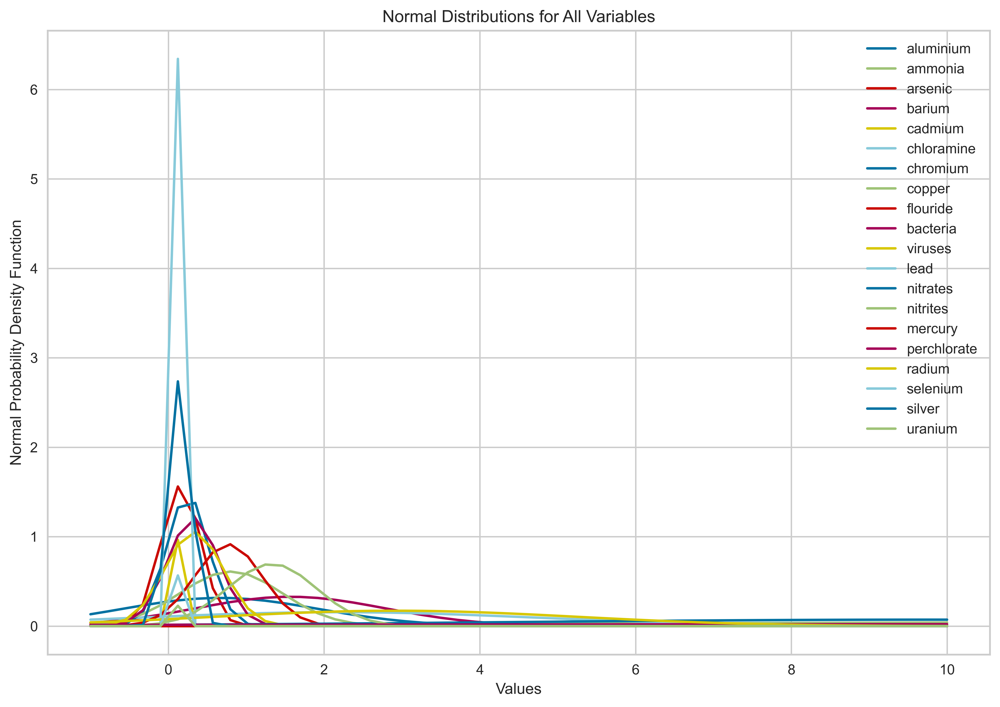

In [14]:
prior_dict_mean = {}
prior_dict_var = {}

for col in drop_y.columns:
    prior_dict_mean[col] = drop_y[col].mean()
    prior_dict_var[col] = drop_y[col].var()
    
x_values = np.linspace(-1, 10)  # Adjust the range of x values as needed

plt.figure(figsize=(12, 8))
for var_name, mean in prior_dict_mean.items():
    var = prior_dict_var[var_name]
    y_values = (1 / np.sqrt(2 * np.pi * var)) * np.exp(-0.5 * ((x_values - mean) ** 2) / var)
    plt.plot(x_values, y_values, label=var_name)

plt.legend()
plt.title('Normal Distributions for All Variables')
plt.xlabel('Values')
plt.ylabel('Normal Probability Density Function')
plt.grid(True)
plt.show()


In [15]:
prob_1 = df['is_safe'].value_counts(1)[1]
prob_0 = df['is_safe'].value_counts(1)[0]

prob_0

0.8859857482185273

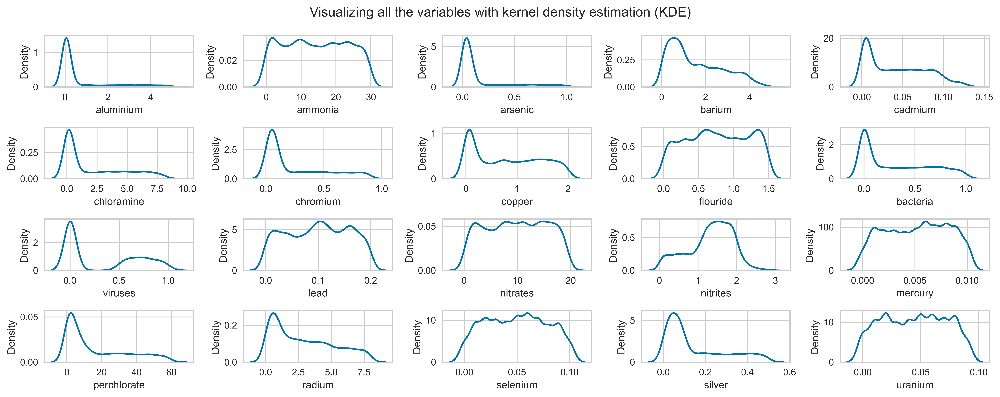

In [16]:
r=4
c=5
it=1
for i,j in enumerate(drop_y.columns):
    plt.suptitle("Visualizing all the variables with kernel density estimation (KDE)")
    plt.subplot(r,c,it)
    if drop_y[j].dtype=='object':
        sns.countplot(y=drop_y[j])
    else:
        sns.kdeplot(drop_y[j])
        plt.grid(True)
    it+=1

plt.tight_layout()
plt.show()

In [17]:
df.skew()

aluminium      2.014072
ammonia         0.02681
arsenic        1.985851
barium         0.661337
cadmium          0.4778
chloramine      0.88868
chromium       1.028728
copper         0.253732
flouride      -0.039305
bacteria       0.554535
viruses        0.425198
lead          -0.060862
nitrates      -0.041938
nitrites      -0.498531
mercury       -0.082363
perchlorate     0.93829
radium         0.548553
selenium       0.010362
silver         1.030034
uranium       -0.027111
is_safe        2.429348
dtype: Float64

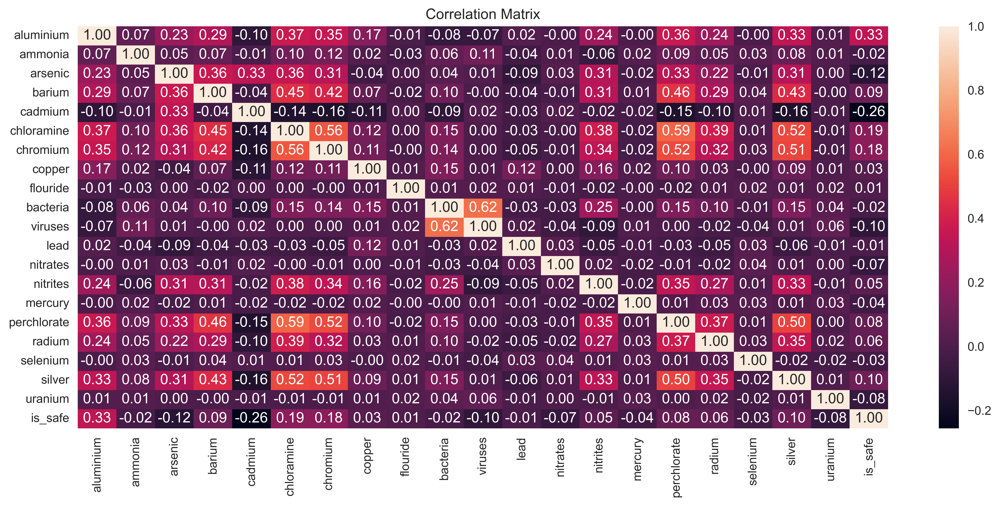

In [18]:
corr = df.corr() 
sns.heatmap(corr, annot=True, fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

Preprocessing

In [19]:
base_columns = ['aluminium', 'ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine', 'chromium', 'copper',
                'flouride', 'bacteria', 'viruses', 'lead', 'nitrates', 'nitrites', 'mercury', 'perchlorate',
                'radium', 'selenium', 'silver', 'uranium']

In [20]:
mmax = MinMaxScaler()
df[base_columns] = mmax.fit_transform(df[base_columns])

df.head().style.background_gradient(cmap = 'Blues', axis = 0)

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,0.326733,0.306150,0.038095,0.576923,0.053846,0.040323,0.922222,0.085000,0.033333,0.200000,0.000000,0.270000,0.810893,0.385666,0.700000,0.629062,0.848561,0.800000,0.680000,0.222222,1
1,0.459406,0.709893,0.009524,0.670040,0.015385,0.608295,0.755556,0.330000,0.600000,0.650000,0.650000,0.500000,0.101362,0.658703,0.300000,0.537577,0.401752,0.800000,0.540000,0.555556,1
2,0.200000,0.471257,0.038095,0.117409,0.061538,0.488479,0.588889,0.010000,0.660000,0.050000,0.003000,0.390000,0.714070,0.378840,0.600000,0.837860,0.884856,0.700000,0.880000,0.111111,0
3,0.269307,0.381350,0.038095,0.599190,0.007692,0.832949,0.033333,0.830000,0.720000,0.710000,0.710000,0.080000,0.071104,0.440273,0.400000,0.151975,0.215269,0.200000,0.900000,0.555556,1
4,0.182178,0.815842,0.028571,0.040486,0.046154,0.307604,0.766667,0.285000,0.406667,0.130000,0.001000,0.585000,0.339889,0.378840,0.300000,0.281620,0.301627,0.200000,0.120000,0.222222,1


In [21]:
df

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,0.326733,0.306150,0.038095,0.576923,0.053846,0.040323,0.922222,0.085,0.033333,0.20,...,0.270,0.810893,0.385666,0.7,0.629062,0.848561,0.8,0.68,0.222222,1
1,0.459406,0.709893,0.009524,0.670040,0.015385,0.608295,0.755556,0.330,0.600000,0.65,...,0.500,0.101362,0.658703,0.3,0.537577,0.401752,0.8,0.54,0.555556,1
2,0.200000,0.471257,0.038095,0.117409,0.061538,0.488479,0.588889,0.010,0.660000,0.05,...,0.390,0.714070,0.378840,0.6,0.837860,0.884856,0.7,0.88,0.111111,0
3,0.269307,0.381350,0.038095,0.599190,0.007692,0.832949,0.033333,0.830,0.720000,0.71,...,0.080,0.071104,0.440273,0.4,0.151975,0.215269,0.2,0.90,0.555556,1
4,0.182178,0.815842,0.028571,0.040486,0.046154,0.307604,0.766667,0.285,0.406667,0.13,...,0.585,0.339889,0.378840,0.3,0.281620,0.301627,0.2,0.12,0.222222,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7994,0.009901,0.262701,0.000000,0.394737,0.307692,0.011521,0.033333,0.015,0.913333,0.00,...,0.985,0.720625,0.341297,0.5,0.059490,0.266583,0.9,0.12,0.333333,1
7995,0.009901,0.812166,0.019048,0.119433,0.076923,0.051843,0.022222,0.010,0.986667,0.00,...,0.155,0.517902,0.341297,0.1,0.024663,0.138924,0.9,0.20,0.888889,1
7996,0.017822,0.231618,0.000000,0.123482,0.230769,0.005760,0.055556,0.010,0.606667,0.00,...,0.910,0.802824,0.341297,0.0,0.022496,0.605757,0.0,0.08,0.555556,1
7997,0.001980,0.336898,0.009524,0.404858,0.000000,0.230415,0.000000,0.045,0.000000,0.00,...,0.000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00,0.000000,1


Checking outliers

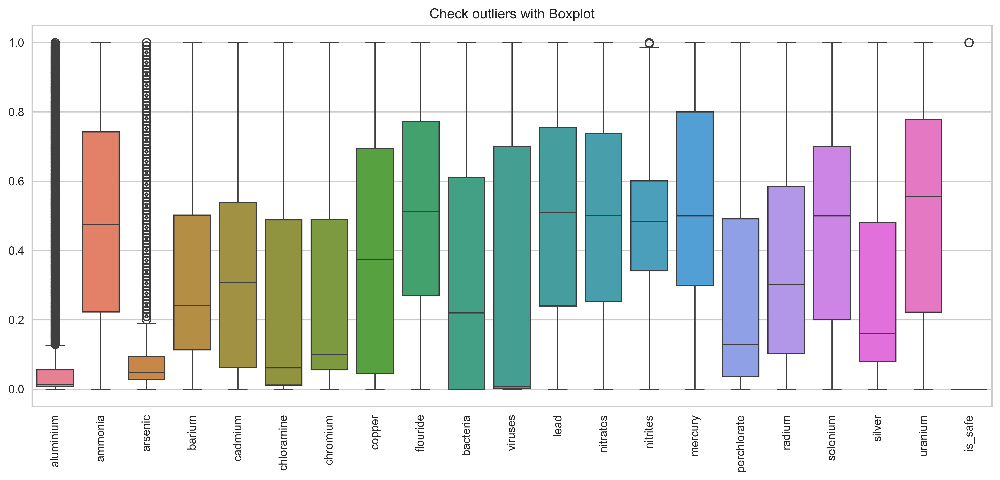

In [22]:
sns.boxplot(df)
plt.xticks(rotation=90)
plt.title('Check outliers with Boxplot')
plt.show()

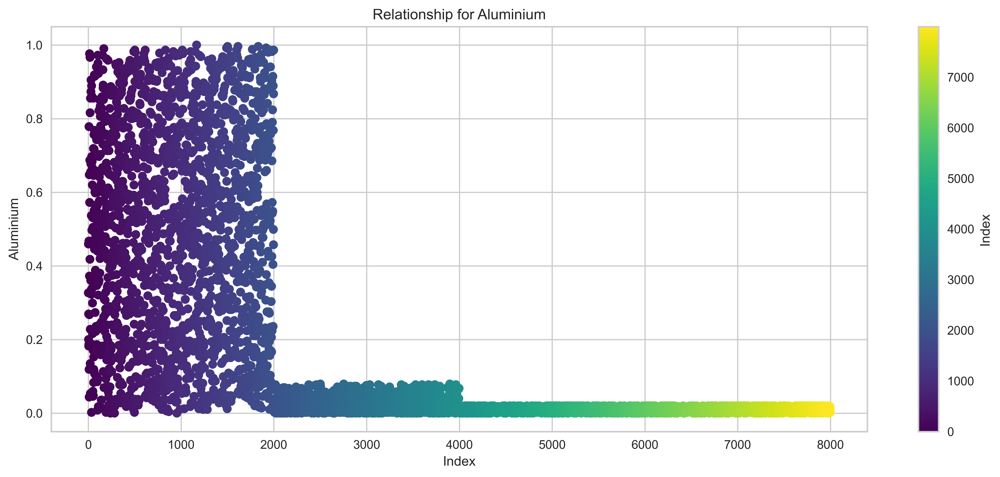

In [23]:
plt.scatter(df.index, df['aluminium'], c=range(len(df)), cmap='viridis')
plt.xlabel('Index')
plt.ylabel('Aluminium')
plt.title('Relationship for Aluminium')
plt.colorbar(label='Index')
plt.show()

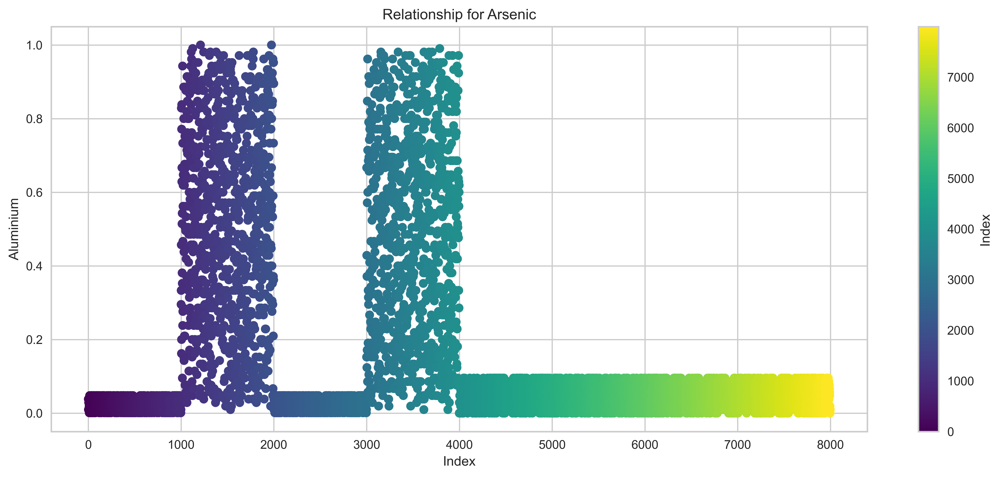

In [24]:
plt.scatter(df.index, df['arsenic'], c=range(len(df)), cmap='viridis')
plt.xlabel('Index')
plt.ylabel('Aluminium')
plt.title('Relationship for Arsenic')
plt.colorbar(label='Index')
plt.show()

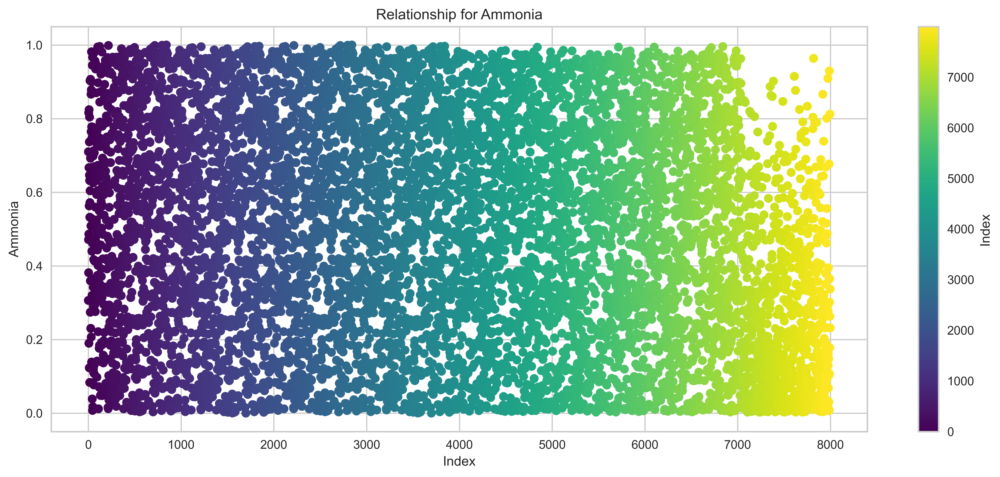

In [25]:
plt.scatter(df.index, df['ammonia'], c=range(len(df)), cmap='viridis')
plt.xlabel('Index')
plt.ylabel('Ammonia')
plt.title('Relationship for Ammonia')
plt.colorbar(label='Index')
plt.show()

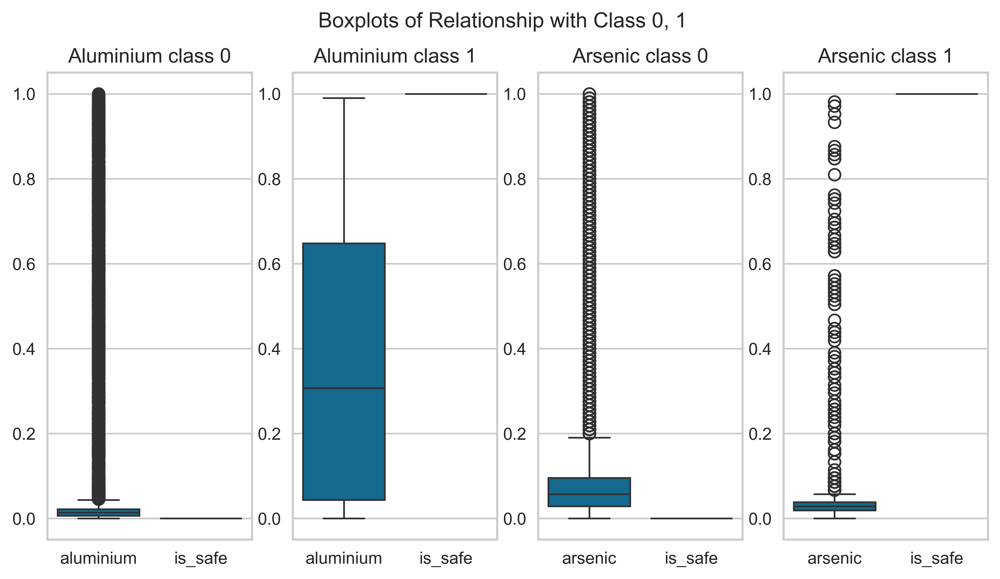

In [26]:
before_forclear_Al = df[['aluminium','is_safe']]
is_safe_bAl0 = before_forclear_Al[before_forclear_Al['is_safe'] == 0]
is_safe_bAl1 = before_forclear_Al[before_forclear_Al['is_safe'] == 1]

before_forclear_As = df[['arsenic','is_safe']]
is_safe_bAs0 = before_forclear_As[before_forclear_As['is_safe'] == 0]
is_safe_bAs1 = before_forclear_As[before_forclear_As['is_safe'] == 1]

fig, ax = plt.subplots(1, 4, figsize=(10, 5))
sns.boxplot(is_safe_bAl0, ax=ax[0])
sns.boxplot(is_safe_bAl1, ax=ax[1])
sns.boxplot(is_safe_bAs0, ax=ax[2])
sns.boxplot(is_safe_bAs1, ax=ax[3])

ax[0].set_title('Aluminium class 0')
ax[1].set_title('Aluminium class 1')
ax[2].set_title('Arsenic class 0')
ax[3].set_title('Arsenic class 1')

# เพิ่ม title ใหญ่สำหรับทั้งภาพ
fig.suptitle('Boxplots of Relationship with Class 0, 1', fontsize=12.5)

plt.show()

Reduce outliers with K-Means

In [27]:
kmean_train =  df[['aluminium', 'arsenic']].values

kmeans = KMeans(n_clusters=2, random_state=0)
kmeans.fit(kmean_train)

c:\Users\BM MONEY\miniconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=2, random_state=0)

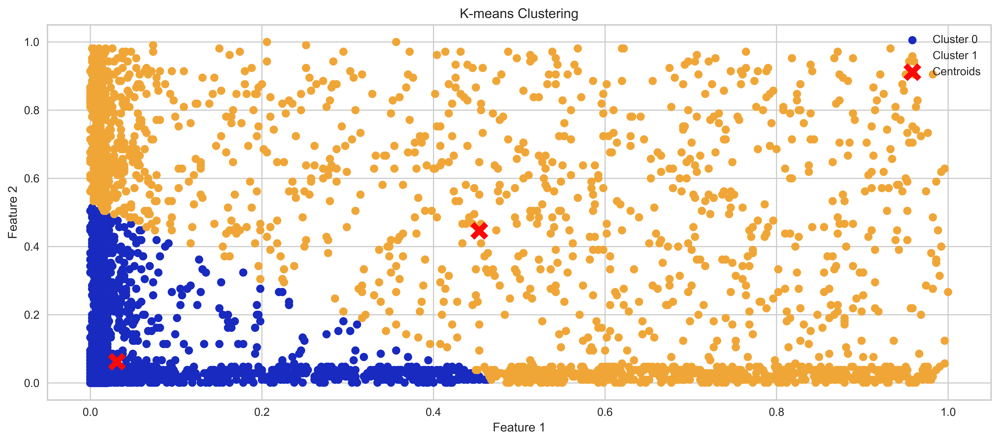

In [28]:
cluster_0 = kmean_train[kmeans.labels_ == 0]
cluster_1 = kmean_train[kmeans.labels_ == 1]

# พล็อตข้อมูลแต่ละกลุ่ม
plt.scatter(cluster_0[:, 0], cluster_0[:, 1], c='#182AC0', label='Cluster 0')
plt.scatter(cluster_1[:, 0], cluster_1[:, 1], c='#F0A637', label='Cluster 1')

# พล็อต centroids ของแต่ละกลุ่ม
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c='#FC0808', marker='x', s=150, linewidths=5, label='Centroids')

# เพิ่มรายละเอียดกราฟ
plt.title('K-means Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid(True)

# แสดงกราฟ
plt.show()


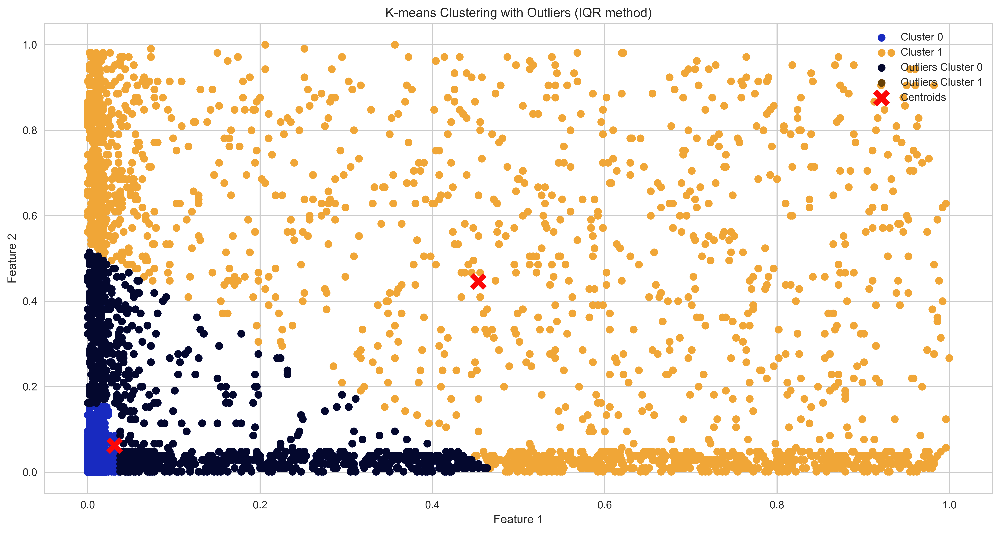

In [29]:
def calculate_iqr_outliers(data):
    Q1 = np.percentile(data, 25, axis=0)
    Q3 = np.percentile(data, 75, axis=0)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # หา outliers
    # Ensure that the condition is applied across all columns (features)
    outliers = data[(np.any(data < lower_bound, axis=1) | np.any(data > upper_bound, axis=1))]
    return outliers

# คำนวณ outliers อีกครั้ง
outliers_cluster_0 = calculate_iqr_outliers(cluster_0)
outliers_cluster_1 = calculate_iqr_outliers(cluster_1)

# จากนั้นใช้โค้ดที่คุณมีเพื่อพล็อตข้อมูลในส่วนที่เหลือ
plt.figure(figsize=[16,8])
plt.scatter(cluster_0[:, 0], cluster_0[:, 1], c='#182AC0', label='Cluster 0')
plt.scatter(cluster_1[:, 0], cluster_1[:, 1], c='#F0A637', label='Cluster 1')
plt.scatter(outliers_cluster_0[:, 0], outliers_cluster_0[:, 1], c='#04082E', marker='o', label='Outliers Cluster 0')
plt.scatter(outliers_cluster_1[:, 0], outliers_cluster_1[:, 1], c='#674106', marker='o', label='Outliers Cluster 1')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c='#FC0808', s=150, marker='x', linewidths=5,label='Centroids')
plt.title('K-means Clustering with Outliers (IQR method)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid(True)
plt.show()

In [30]:
cluster_1.shape

(1910, 2)

In [31]:
data_non_outliers = []

# เพิ่มข้อมูลที่ไม่ใช่ outlier ของ cluster 0
for point in cluster_0:
    if point.tolist() not in outliers_cluster_0.tolist():
        data_non_outliers.append({'aluminium': point[0], 'arsenic': point[1]})

# เพิ่มข้อมูลที่ไม่ใช่ outlier ของ cluster 1
for point in cluster_1:
    if point.tolist() not in outliers_cluster_1.tolist():
        data_non_outliers.append({'aluminium': point[0], 'arsenic': point[1]})

# สร้าง DataFrame จาก List ข้อมูลที่ไม่ใช่ outlier
df_non_outliers = pd.DataFrame(data_non_outliers)

# แสดง DataFrame ที่มีข้อมูลที่ไม่ใช่ outlier
df_non_outliers

,aluminium,arsenic
0,0.001980,0.000952
1,0.007921,0.019048
2,0.017822,0.038095
3,0.035644,0.038095
4,0.035644,0.038095
...,...,...
6935,0.065347,0.923810
6936,0.039604,0.628571
6937,0.017822,0.561905
6938,0.067327,0.600000


In [32]:
Q1 = df['aluminium'].quantile(0.25)
Q3 = df['arsenic'].quantile(0.75)
IQR = Q3 - Q1

# ตรวจสอบค่า outlier
outliers = df[(df['aluminium'] < (Q1 - 1.5 * IQR)) | (df['arsenic'] > (Q3 + 1.5 * IQR))]
outliers['aluminium']

1000    0.336634
1001    0.469307
1002    0.209901
1003    0.279208
1006    0.477228
          ...   
3994    0.039604
3995    0.017822
3996    0.007921
3997    0.067327
3998    0.017822
Name: aluminium, Length: 1580, dtype: float64

In [33]:
outliers['aluminium'].update(df_non_outliers['aluminium'])
outliers['arsenic'].update(df_non_outliers['arsenic'])
outliers[['aluminium','arsenic']]

C:\Users\BM MONEY\AppData\Local\Temp\ipykernel_9860\3552155761.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers['aluminium'].update(df_non_outliers['aluminium'])
C:\Users\BM MONEY\AppData\Local\Temp\ipykernel_9860\3552155761.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers['arsenic'].update(df_non_outliers['arsenic'])


,aluminium,arsenic
1000,0.015842,0.123810
1001,0.007921,0.047619
1002,0.017822,0.047619
1003,0.015842,0.152381
1006,0.019802,0.104762
...,...,...
3994,0.007921,0.019048
3995,0.017822,0.095238
3996,0.015842,0.085714
3997,0.011881,0.095238


In [34]:
df['aluminium'].update(outliers['aluminium'])
df['arsenic'].update(outliers['arsenic'])
df[['aluminium','arsenic']]

,aluminium,arsenic
0,0.326733,0.038095
1,0.459406,0.009524
2,0.200000,0.038095
3,0.269307,0.038095
4,0.182178,0.028571
...,...,...
7994,0.009901,0.000000
7995,0.009901,0.019048
7996,0.017822,0.000000
7997,0.001980,0.009524


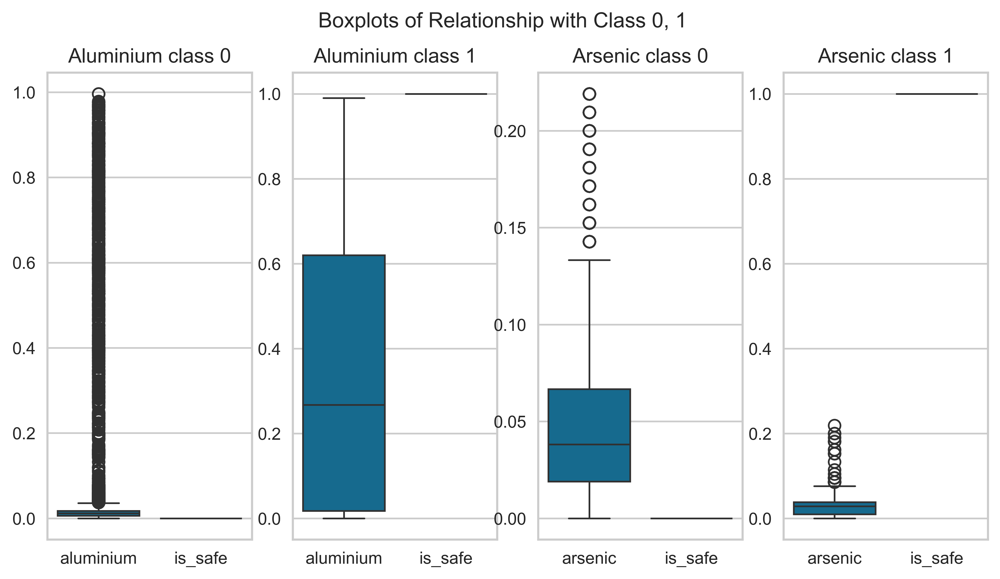

In [35]:
after_forclear_Al = df[['aluminium','is_safe']]
is_safe_aAl0 = after_forclear_Al[after_forclear_Al['is_safe'] == 0]
is_safe_aAl1 = after_forclear_Al[after_forclear_Al['is_safe'] == 1]


after_forclear_As = df[['arsenic','is_safe']]
is_safe_aAs0 = after_forclear_As[after_forclear_As['is_safe'] == 0]
is_safe_aAs1 = after_forclear_As[after_forclear_As['is_safe'] == 1]

fig, ax = plt.subplots(1, 4, figsize=(10, 5))

sns.boxplot(is_safe_aAl0, ax=ax[0])
sns.boxplot(is_safe_aAl1, ax=ax[1])
sns.boxplot(is_safe_aAs0, ax=ax[2])
sns.boxplot(is_safe_aAs1, ax=ax[3])

ax[0].set_title('Aluminium class 0')
ax[1].set_title('Aluminium class 1')
ax[2].set_title('Arsenic class 0')
ax[3].set_title('Arsenic class 1')

# เพิ่ม title ใหญ่สำหรับทั้งภาพ
fig.suptitle('Boxplots of Relationship with Class 0, 1', fontsize=12.5)

plt.show()

C:\Users\BM MONEY\AppData\Local\Temp\ipykernel_9860\2311072595.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='is_safe', data=df, palette={'0': '#FDB03A', '1': '#3D3AFD'})


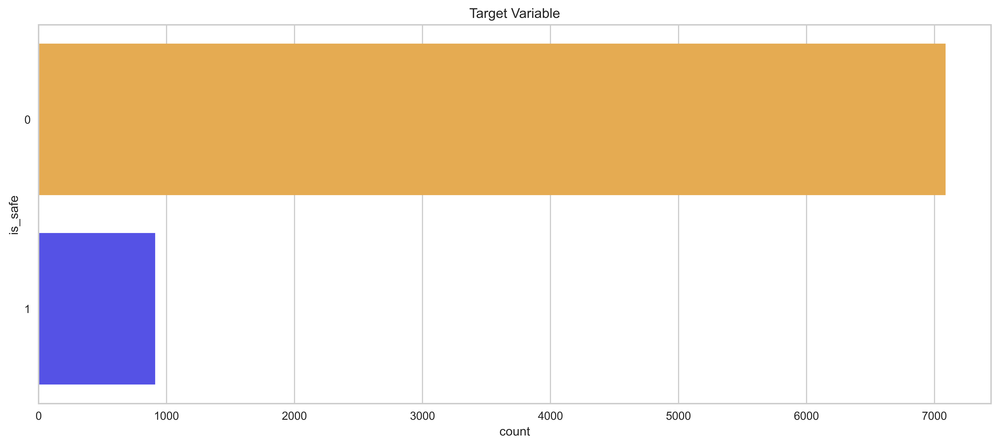

In [36]:
sns.countplot(y='is_safe', data=df, palette={'0': '#FDB03A', '1': '#3D3AFD'})
plt.title('Target Variable')
plt.show()

Model Train (supervised learning)

In [37]:
X = df.drop('is_safe', axis=1)
y = df['is_safe'].astype('int64')

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

# Verify imputation
missing_after_imputation = df.isnull().sum().max()

missing_after_imputation, X_train.shape, X_test.shape, y_train.shape, y_test.shape


(0, (4799, 20), (3200, 20), (4799,), (3200,))

Define Classes

In [39]:
classes = np.unique(y_train)
classes

array([0, 1], dtype=int64)

BernoulliNB

In [40]:
# Bernoulli

Bern = BernoulliNB()
Bern.fit(X_train, y_train)

y_predBern = Bern.predict(X_test)

In [41]:
y_predBern[:1000]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [42]:
accuracyBern = accuracy_score(y_test, y_predBern)
# report_Bern = classification_report(y_test, y_predBern)

print(f'Accuracy score: {accuracyBern}')
print('*'*20)
# print(f'Report: {report_Bern}')

Accuracy score: 0.87625
********************


In [43]:
cmBern = confusion_matrix(y_test, y_predBern)
cmBern

array([[2804,    1],
       [ 395,    0]], dtype=int64)

c:\Users\BM MONEY\miniconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but BernoulliNB was fitted with feature names
  warnings.warn(


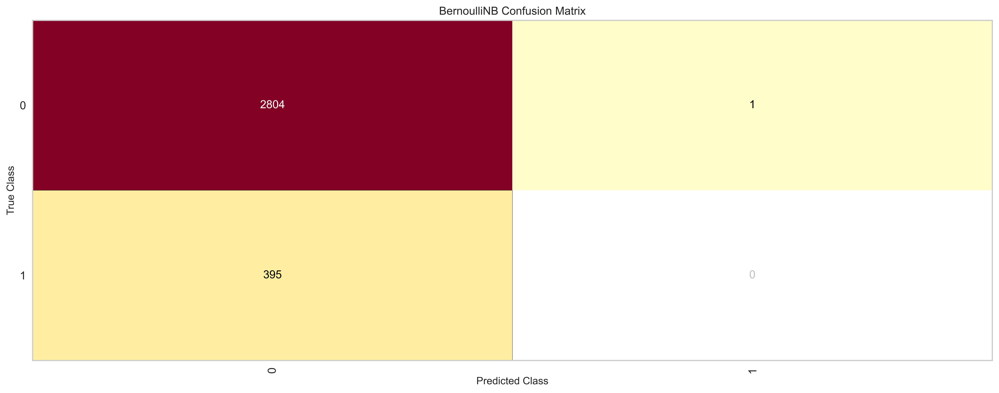

<Axes: title={'center': 'BernoulliNB Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [44]:
cmBern_viz = ConfusionMatrix(Bern)
cmBern_viz.fit(X_train, y_train)  # ทำการ fit model ก่อนเพื่อให้สามารถแสดง confusion matrix ได้
cmBern_viz.score(X_test, y_test)  # ทำการ score เพื่อสร้าง confusion matrix
cmBern_viz.show()

c:\Users\BM MONEY\miniconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but BernoulliNB was fitted with feature names
  warnings.warn(


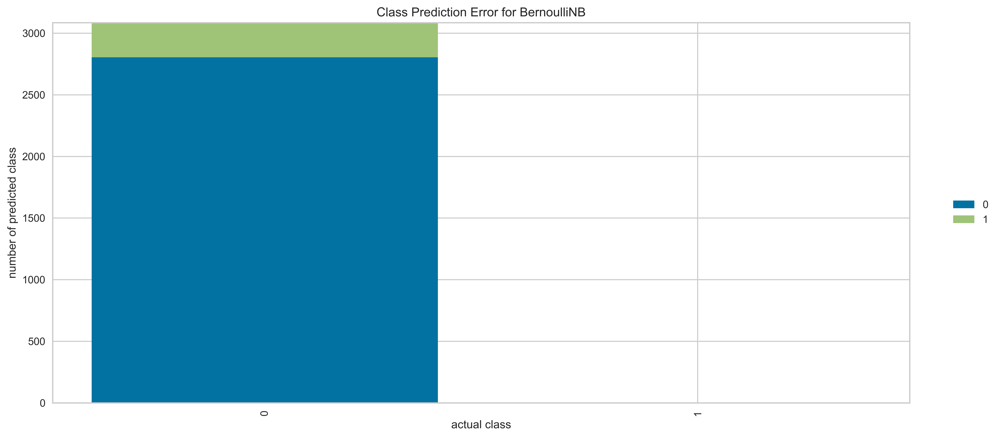

ClassPredictionError(ax=<Axes: title={'center': 'Class Prediction Error for BernoulliNB'}, xlabel='actual class', ylabel='number of predicted class'>,
                     classes=array([0, 1], dtype=int64),
                     estimator=BernoulliNB())

In [45]:
class_prediction_error(Bern, X_train, y_train, X_test, y_test, classes=classes)

c:\Users\BM MONEY\miniconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but BernoulliNB was fitted with feature names
  warnings.warn(


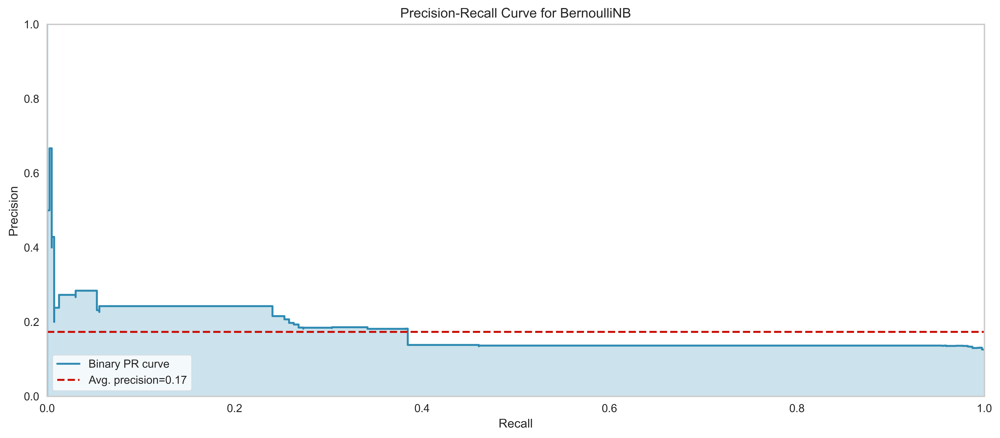

PrecisionRecallCurve(ax=<Axes: title={'center': 'Precision-Recall Curve for BernoulliNB'}, xlabel='Recall', ylabel='Precision'>,
                     classes=array([0, 1], dtype=int64),
                     estimator=BernoulliNB(),
                     iso_f1_values={0.2, 0.4, 0.6, 0.8})

In [46]:
precision_recall_curve(Bern, X_train, y_train, X_test, y_test, classes=classes)

GaussianNB

In [47]:
# GaussianNB Distribution 
gnb = GaussianNB()
gnb.fit(X_train, y_train)

y_predGnb = gnb.predict(X_test)
y_predGnb[:100]

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], dtype=int64)

In [48]:
accuracyGnb = accuracy_score(y_test, y_predGnb)

print(f'Accuracy score: {accuracyGnb}')
print('*'*20)

Accuracy score: 0.885
********************


In [49]:
y_proba = gnb.predict_proba(X_test)

In [50]:
class_gnb_prior = gnb.class_prior_
class_gnb_prior

array([0.89226922, 0.10773078])

In [51]:
cmGnb = confusion_matrix(y_test, y_predGnb)
cmGnb

array([[2602,  203],
       [ 165,  230]], dtype=int64)

c:\Users\BM MONEY\miniconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


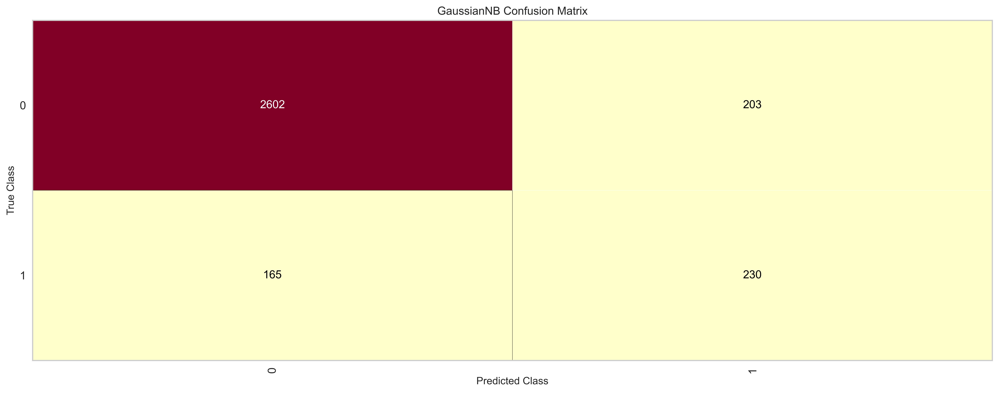

<Axes: title={'center': 'GaussianNB Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [52]:
cmGnb_viz = ConfusionMatrix(gnb)
cmGnb_viz.fit(X_train, y_train)  # ทำการ fit model ก่อนเพื่อให้สามารถแสดง confusion matrix ได้
cmGnb_viz.score(X_test, y_test)  # ทำการ score เพื่อสร้าง confusion matrix
cmGnb_viz.show()

c:\Users\BM MONEY\miniconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


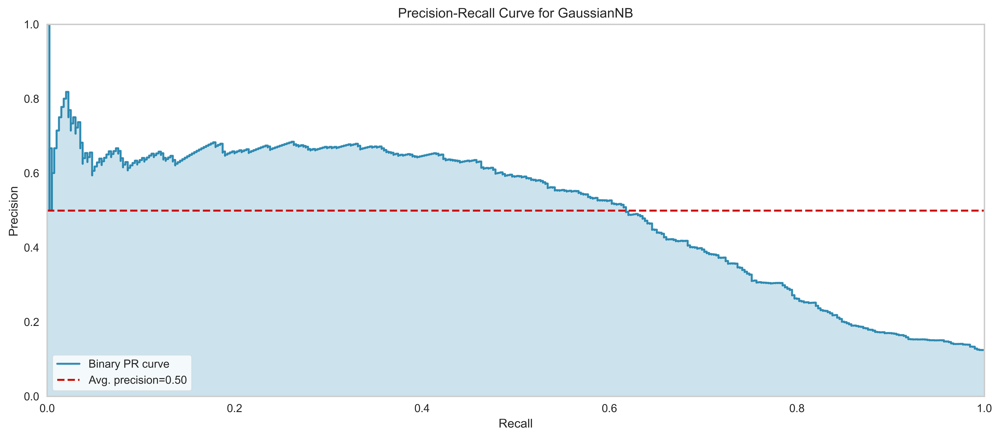

PrecisionRecallCurve(ax=<Axes: title={'center': 'Precision-Recall Curve for GaussianNB'}, xlabel='Recall', ylabel='Precision'>,
                     classes=array([0, 1], dtype=int64), estimator=GaussianNB(),
                     iso_f1_values={0.2, 0.4, 0.6, 0.8})

In [53]:
precision_recall_curve(gnb, X_train, y_train, X_test, y_test, classes=classes)

c:\Users\BM MONEY\miniconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


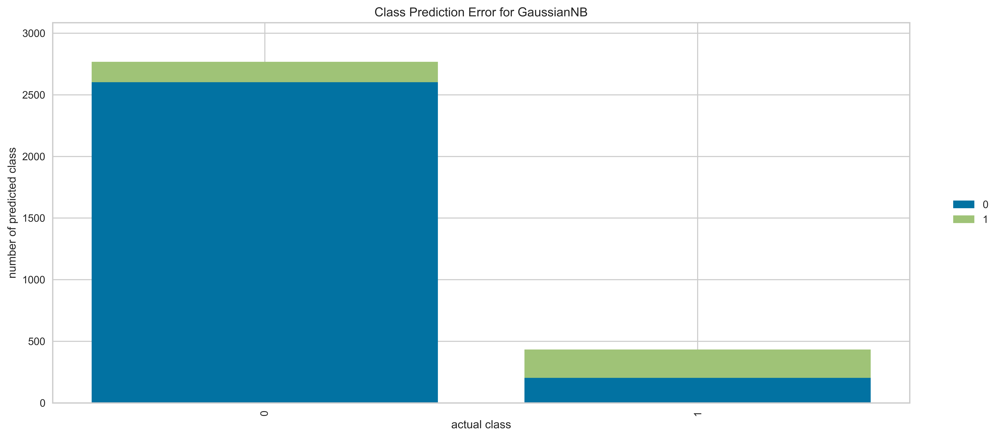

ClassPredictionError(ax=<Axes: title={'center': 'Class Prediction Error for GaussianNB'}, xlabel='actual class', ylabel='number of predicted class'>,
                     classes=array([0, 1], dtype=int64),
                     estimator=GaussianNB())

In [54]:
class_prediction_error(gnb, X_train, y_train, X_test, y_test, classes=classes)

In [55]:
print(f'index of argmin class 0 : {y_proba[:, 0].argmin()}, and class 1 : {y_proba[:, 1].argmin()}')
print(f'index of argmax class 0 : {y_proba[:, 0].argmax()}, and class 1 : {y_proba[:, 1].argmax()}')

index of argmin class 0 : 3190, and class 1 : 2454
index of argmax class 0 : 2454, and class 1 : 3190


In [56]:
post_gnbC0 = y_proba[2600][0]
post_gnbC1 = y_proba[3190][1]

post_gnbC0, post_gnbC1

(0.9989558557032172, 0.999999970940356)

In [57]:
new_dictGnb = { classes[0]: post_gnbC0,
               classes[1] : post_gnbC1 }

new_dictGnb

{0: 0.9989558557032172, 1: 0.999999970940356}

In [58]:
var_gnbC0 = y_proba[240].var()
var_gnbC1 = y_proba[3190].var()

Posterior plot by GaussianNB

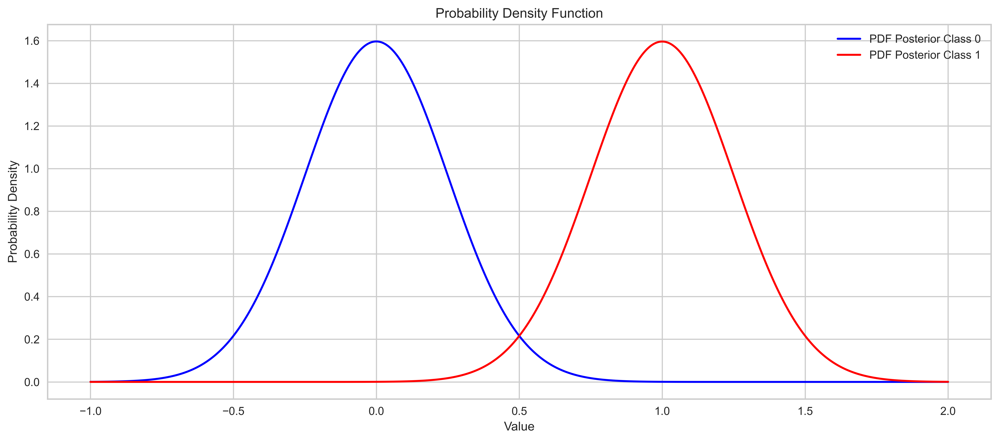

In [59]:
# ค่าความน่าจะเป็น (probability) จาก dictionary
probabilities = new_dictGnb

# ค่าเฉลี่ยและค่าเบี่ยงเบนมาตรฐาน
mean_0 = 0
mean_1 = 1 
var_0 = var_gnbC0
var_1 = var_gnbC1

x = np.linspace(-1, 2, 1000)

# Calculate PDF Each line
pdf_0 = 1 / (var_0 * np.sqrt(2 * np.pi)) * np.exp(- (x - mean_0)**2 / (2 * var_0**2))
pdf_1 = 1 / (var_1 * np.sqrt(2 * np.pi)) * np.exp(- (x - mean_1)**2 / (2 * var_1**2))

plt.plot(x, pdf_0, label='PDF Posterior Class 0', color='blue')
plt.plot(x, pdf_1, label='PDF Posterior Class 1', color='red')

plt.xlabel('Value')
plt.ylabel('Probability Density')
plt.title('Probability Density Function')
plt.legend()
plt.show()


Adjust GNB by sigmoid function

In [60]:
# สร้าง CalibratedClassifierCV ที่ใช้ Platt scaling

calibrated_model = CalibratedClassifierCV(gnb, method='sigmoid')

calibrated_model.fit(X_train, y_train)

# ทำนายผล
y_predCa = calibrated_model.predict(X_test)

# คำนวณความแม่นยำ
accuracyCa = accuracy_score(y_test, y_predCa)
print("Accuracy:", accuracyCa)

Accuracy: 0.900625


0.885
0.900625


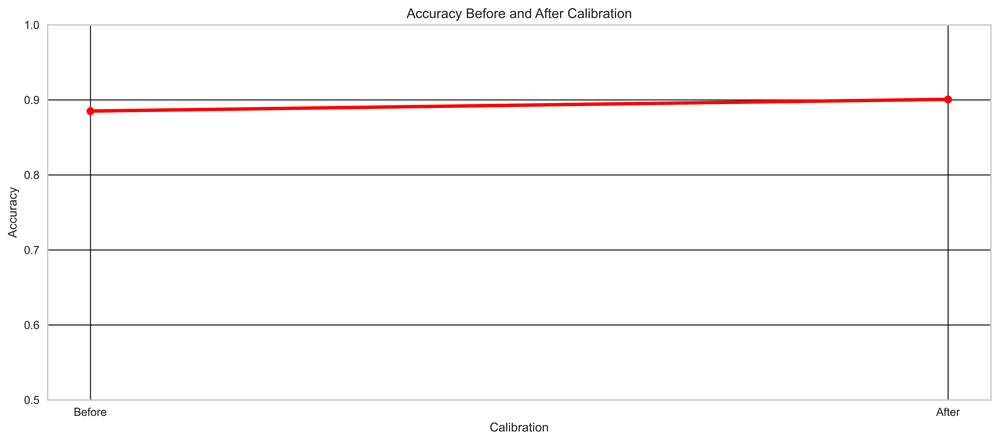

In [61]:
accuracy_before = accuracyGnb
accuracy_after = accuracyCa

print(accuracy_before)
print(accuracy_after)
# พล็อตกราฟเส้น
plt.plot([0, 1], [accuracy_before, accuracy_after], marker='o', color='red', linewidth=3)
plt.title('Accuracy Before and After Calibration')
plt.xlabel('Calibration')
plt.ylabel('Accuracy')
plt.ylim(0.5, 1)
plt.xticks([0, 1], ['Before', 'After'])
plt.grid(True, alpha=0.8, color='black')
plt.show()

In [62]:
cof_calib = confusion_matrix(y_test, y_predCa)
cof_calib

array([[2721,   84],
       [ 234,  161]], dtype=int64)

c:\Users\BM MONEY\miniconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


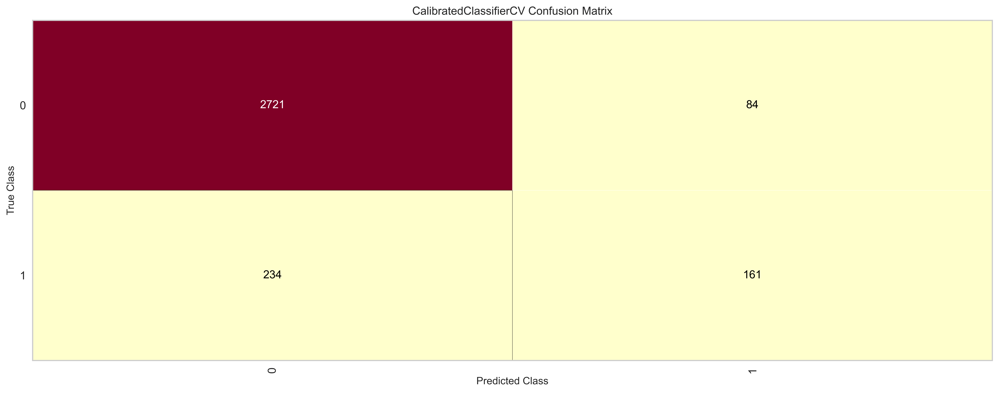

<Axes: title={'center': 'CalibratedClassifierCV Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [63]:
cmGnb_viz2 = ConfusionMatrix(calibrated_model)
cmGnb_viz2.fit(X_train, y_train)  # ทำการ fit model ก่อนเพื่อให้สามารถแสดง confusion matrix ได้
cmGnb_viz2.score(X_test, y_test)  # ทำการ score เพื่อสร้าง confusion matrix
cmGnb_viz2.show()

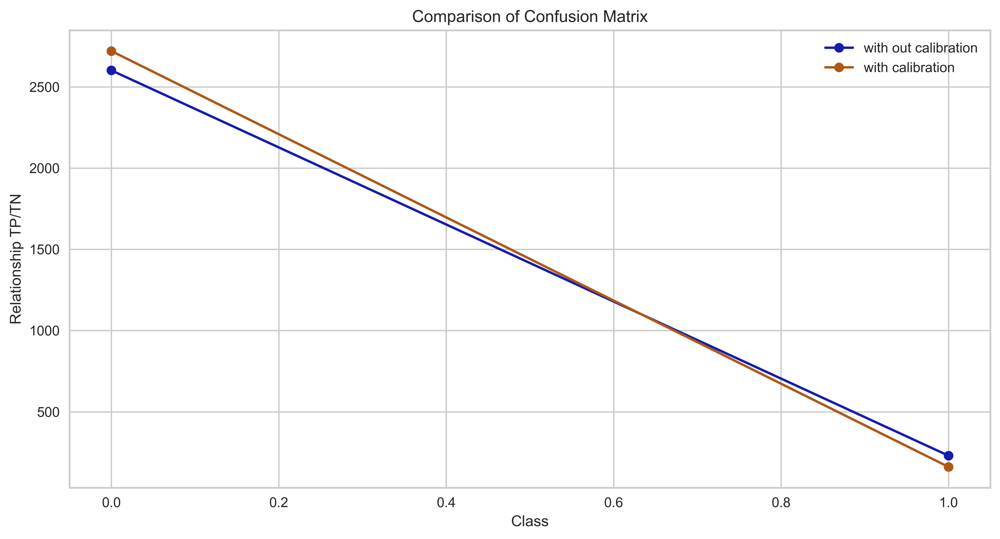

In [64]:
cm_model1 = confusion_matrix(y_test, y_predGnb)

# คำนวณ Confusion Matrix ของโมเดลที่ 2
cm_model2 = confusion_matrix(y_test, y_predCa)

# พล็อตกราฟเส้นเปรียบเทียบ Confusion Matrix ของทั้งสองโมเดล
plt.figure(figsize=(12, 6))
plt.plot(gnb.classes_, cm_model1.diagonal(), marker='o', c='#161CAE', label='with out calibration')
plt.plot(calibrated_model.classes_, cm_model2.diagonal(), marker='o', c='#AE5816', label='with calibration')
plt.title('Comparison of Confusion Matrix')
plt.xlabel('Class')
plt.ylabel('Relationship TP/TN')
plt.legend()
plt.grid(True)
plt.show()

Logistic Regression

In [65]:
logist = LogisticRegression()

logist.fit(X_train, y_train)

# Make predictions on the testing data
y_predLogist = logist.predict(X_test)

# Evaluate the model
accuracyLogist = accuracy_score(y_test, y_predLogist)

print("Accuracy:", accuracyLogist)

Accuracy: 0.9040625


In [66]:
y_predLogist[:1000]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [67]:
cmLogist = confusion_matrix(y_test, y_predLogist)
cmLogist

array([[2762,   43],
       [ 264,  131]], dtype=int64)

c:\Users\BM MONEY\miniconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


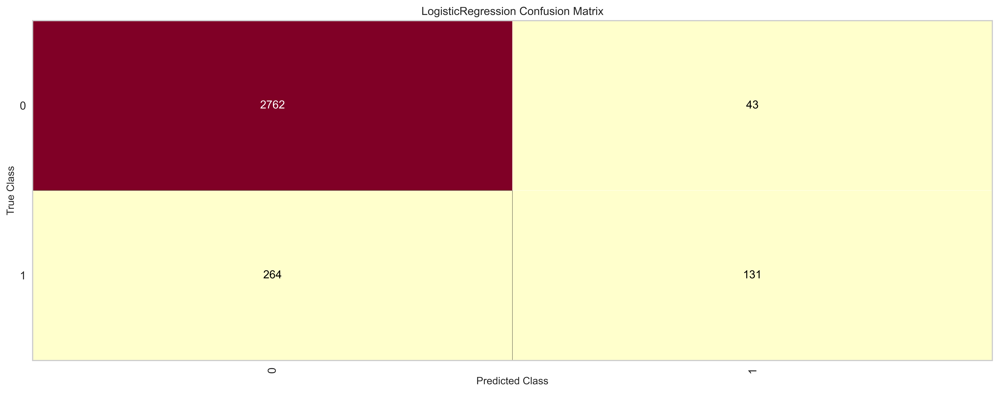

<Axes: title={'center': 'LogisticRegression Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [68]:
cmLogist_viz = ConfusionMatrix(logist)
cmLogist_viz.fit(X_train, y_train)  # ทำการ fit model ก่อนเพื่อให้สามารถแสดง confusion matrix ได้
cmLogist_viz.score(X_test, y_test)  # ทำการ score เพื่อสร้าง confusion matrix
cmLogist_viz.show()

c:\Users\BM MONEY\miniconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


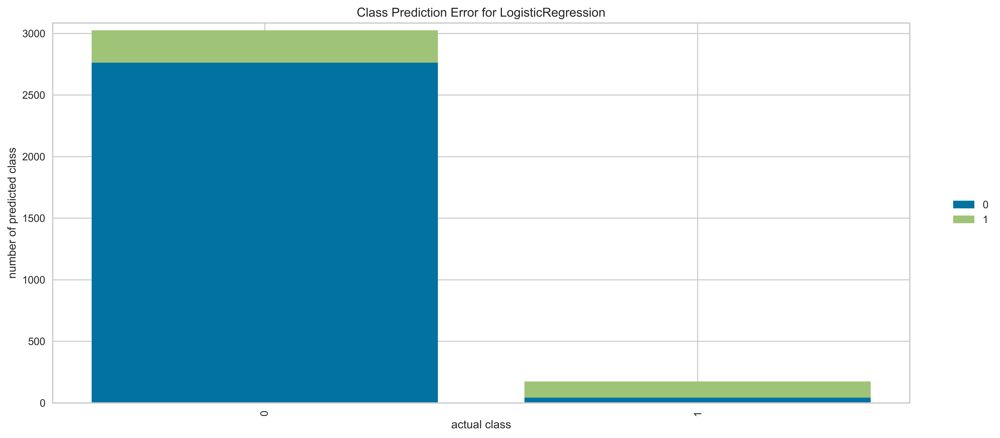

ClassPredictionError(ax=<Axes: title={'center': 'Class Prediction Error for LogisticRegression'}, xlabel='actual class', ylabel='number of predicted class'>,
                     classes=array([0, 1], dtype=int64),
                     estimator=LogisticRegression())

In [69]:
class_prediction_error(logist, X_train, y_train, X_test, y_test, classes=classes)

c:\Users\BM MONEY\miniconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


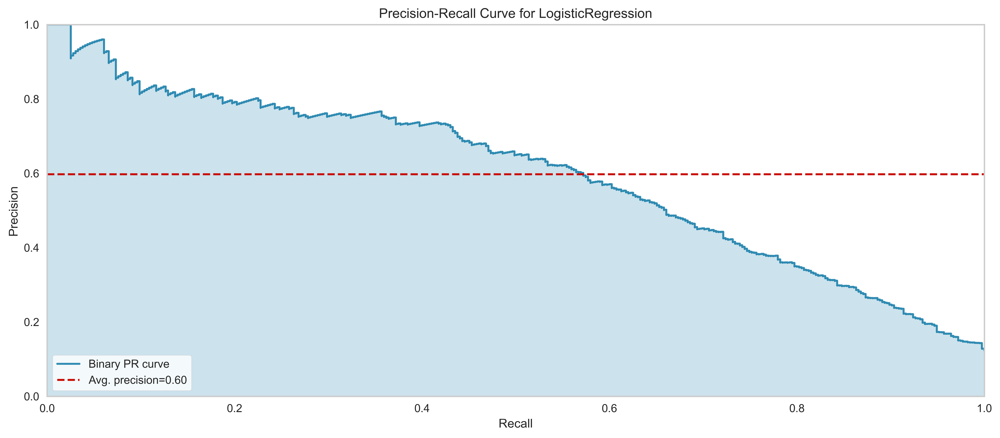

PrecisionRecallCurve(ax=<Axes: title={'center': 'Precision-Recall Curve for LogisticRegression'}, xlabel='Recall', ylabel='Precision'>,
                     classes=array([0, 1], dtype=int64),
                     estimator=LogisticRegression(),
                     iso_f1_values={0.2, 0.4, 0.6, 0.8})

In [70]:
precision_recall_curve(logist, X_train, y_train, X_test, y_test, classes=classes)

KNN

In [71]:

param_grid = {'n_neighbors':np.arange(1,20), 'metric':['euclidean', 'manhattan', 'minkowski']}
knn = KNeighborsClassifier()
knn_cv = GridSearchCV(knn,param_grid,cv=5)
knn_cv.fit(X_train,y_train)

y_pred_knn_cv = knn_cv.predict(X_test)

accuracyKNN = accuracy_score(y_test, y_pred_knn_cv)

# print("Best Score:" + str(knn_cv.best_score_))
print("Best Parameters: " + str(knn_cv.best_params_))


Best Parameters: {'metric': 'euclidean', 'n_neighbors': 15}


In [72]:
accuracyKNN

0.8996875

In [73]:
cf_matrix_knn_cv = confusion_matrix(y_test, y_pred_knn_cv)
print(cf_matrix_knn_cv)

[[2785   20]
 [ 301   94]]


c:\Users\BM MONEY\miniconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


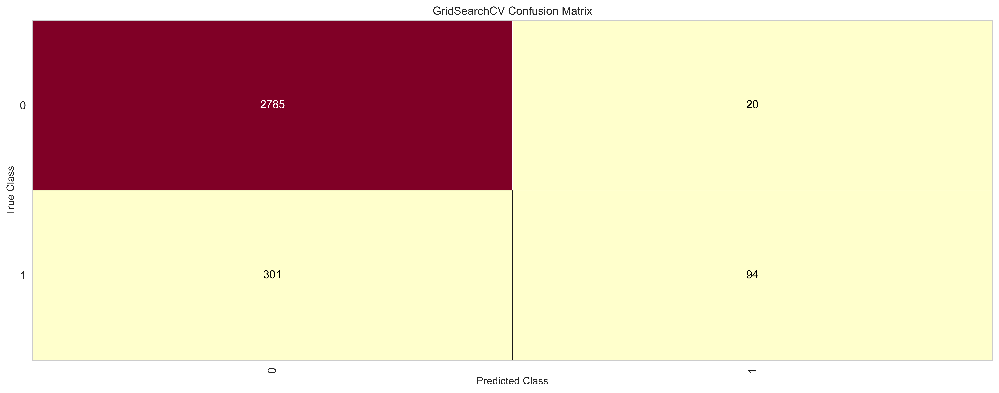

<Axes: title={'center': 'GridSearchCV Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [74]:
cmKNN_viz = ConfusionMatrix(knn_cv)
cmKNN_viz.fit(X_train, y_train)
cmKNN_viz.score(X_test, y_test)
cmKNN_viz.show()

c:\Users\BM MONEY\miniconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


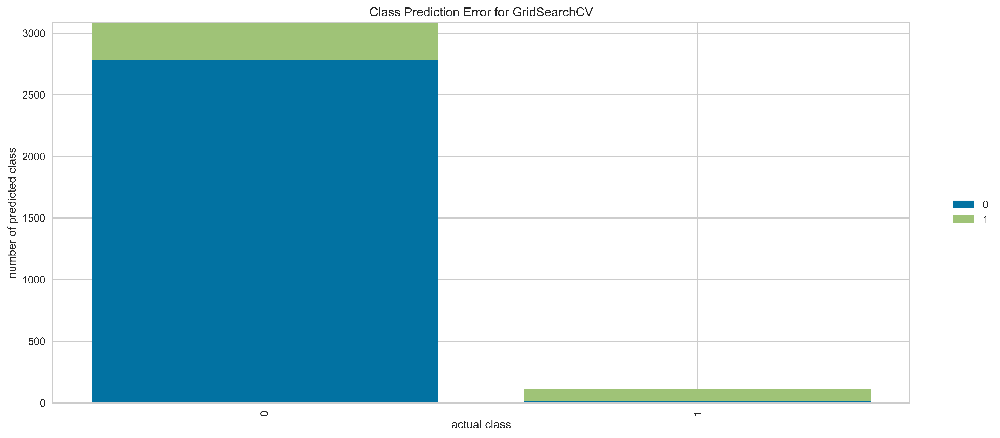

ClassPredictionError(ax=<Axes: title={'center': 'Class Prediction Error for GridSearchCV'}, xlabel='actual class', ylabel='number of predicted class'>,
                     classes=array([0, 1], dtype=int64),
                     estimator=GridSearchCV(cv=5,
                                            estimator=KNeighborsClassifier(),
                                            param_grid={'metric': ['euclidean',
                                                                   'manhattan',
                                                                   'minkowski'],
                                                        'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19])}))

In [75]:
class_prediction_error(knn_cv, X_train, y_train, X_test, y_test, classes=classes)

c:\Users\BM MONEY\miniconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


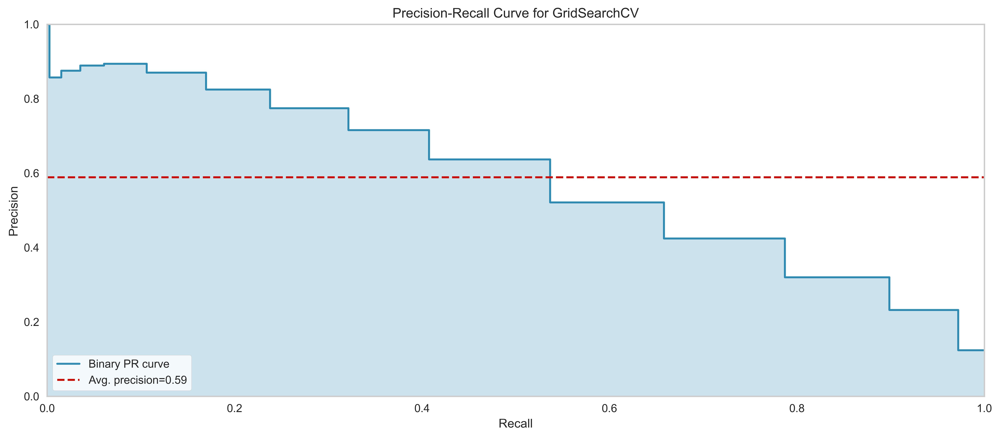

PrecisionRecallCurve(ax=<Axes: title={'center': 'Precision-Recall Curve for GridSearchCV'}, xlabel='Recall', ylabel='Precision'>,
                     classes=array([0, 1], dtype=int64),
                     estimator=GridSearchCV(cv=5,
                                            estimator=KNeighborsClassifier(),
                                            param_grid={'metric': ['euclidean',
                                                                   'manhattan',
                                                                   'minkowski'],
                                                        'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19])}),
                     iso_f1_values={0.2, 0.4, 0.6, 0.8})

In [76]:
precision_recall_curve(knn_cv, X_train, y_train, X_test, y_test, classes=classes)

Decision Tree

In [78]:
dst = DecisionTreeClassifier()

# ฝึกโมเดล
dst.fit(X_train, y_train)

# ทำนายค่าข้อมูลทดสอบ
y_predDst = dst.predict(X_test)

# คำนวณความแม่นยำ
accuracyDST = accuracy_score(y_test, y_predDst)
accuracyDST

0.939375

In [79]:
y_predDst[:1000]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [80]:
accuracy_list = []

for _ in range(10):
    # สร้างและฝึกโมเดล Decision Tree
    dst = DecisionTreeClassifier()
    dst.fit(X_train, y_train)

    # ทำนายค่าข้อมูลทดสอบ
    y_predDst = dst.predict(X_test)

    # คำนวณความแม่นยำและเพิ่มค่าลงในลิสต์
    accuracyDST = accuracy_score(y_test, y_predDst)
    accuracy_list.append(accuracyDST)

# คำนวณค่าเฉลี่ยของความแม่นยำ
average_accuracy = sum(accuracy_list) / len(accuracy_list)
average_accuracy

0.9407187499999999

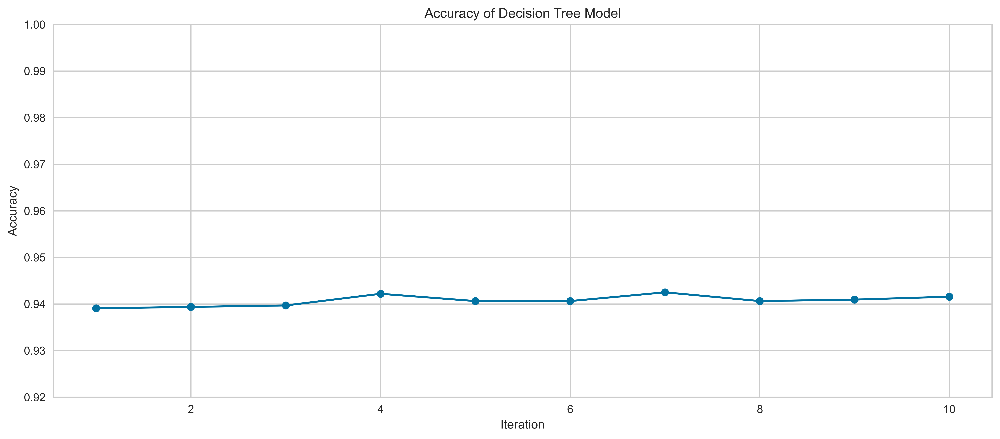

In [81]:
plt.plot(range(1, 11), accuracy_list, marker='o', linestyle='-')
plt.title('Accuracy of Decision Tree Model')
plt.xlabel('Iteration')
plt.ylabel('Accuracy')
plt.ylim(0.92, 1.0)
plt.grid(True)
plt.show()

In [82]:
cmDst = confusion_matrix(y_test, y_predDst)
cmDst

array([[2713,   92],
       [  95,  300]], dtype=int64)

c:\Users\BM MONEY\miniconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


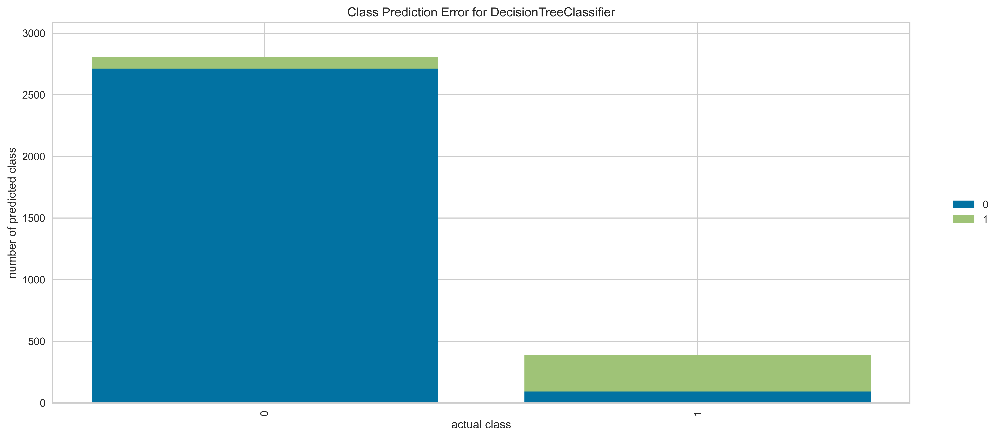

ClassPredictionError(ax=<Axes: title={'center': 'Class Prediction Error for DecisionTreeClassifier'}, xlabel='actual class', ylabel='number of predicted class'>,
                     classes=array([0, 1], dtype=int64),
                     estimator=DecisionTreeClassifier())

In [83]:
class_prediction_error(dst, X_train, y_train, X_test, y_test, classes=classes)

c:\Users\BM MONEY\miniconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


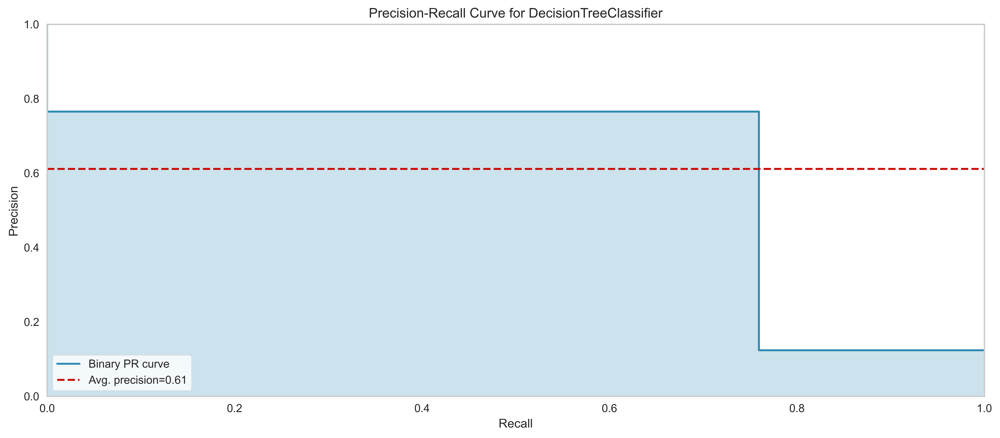

PrecisionRecallCurve(ax=<Axes: title={'center': 'Precision-Recall Curve for DecisionTreeClassifier'}, xlabel='Recall', ylabel='Precision'>,
                     classes=array([0, 1], dtype=int64),
                     estimator=DecisionTreeClassifier(),
                     iso_f1_values={0.2, 0.4, 0.6, 0.8})

In [84]:
precision_recall_curve(dst, X_train, y_train, X_test, y_test, classes=classes)

Models Evaluated

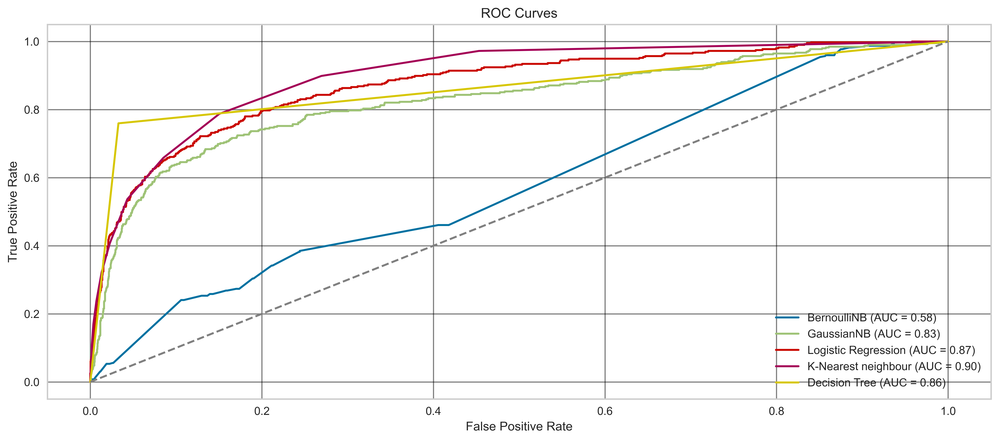

In [86]:

models = {'BernoulliNB': Bern, 'GaussianNB': gnb, 'Logistic Regression': logist, 'K-Nearest neighbour': knn_cv,'Decision Tree': dst}


for name, model in models.items():
    y_score = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc='lower right')
plt.grid(True, alpha=0.5, color='black')
plt.show()
